In [38]:
import bokeh.plotting as bpl
import cv2
import glob
import logging
import matplotlib.pyplot as plt
import numpy as np
import os

try:
    cv2.setNumThreads(0)
except():
    pass

try:
    if __IPYTHON__:
        # this is used for debugging purposes only. allows to reload classes
        # when changed
        get_ipython().magic('load_ext autoreload')
        get_ipython().magic('autoreload 2')
except NameError:
    pass

import caiman as cm
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour
from caiman.source_extraction.cnmf import deconvolution
bpl.output_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading BokehJS ...

## Set up logger (optional):

In [2]:
logging.basicConfig(format=
                          "%(relativeCreated)12d [%(filename)s:%(funcName)20s():%(lineno)s] [%(process)d] %(message)s",
                    # filename="/tmp/caiman.log",
                    level=logging.WARNING)

## Full paths to files:

In [3]:
fnames = [
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_009_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_010_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_011_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_012_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_013_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_014_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_015_ch1.tif',
    'D:\calcium\\171030_03_GCAMP6f_tiffs\Scan_016_ch1.tif',
]

## Set Parameters:

In [4]:
# dataset dependent parameters
fr = 8                             # imaging rate in frames per second
decay_time = .9  #1                   # length of a typical transient in seconds

# parameters for source extraction and deconvolution
p = 1                       # order of the autoregressive system
gnb = 2  #4                     # number of global background components
merge_thresh = .5  #.7#0.8          # merging threshold, max correlation allowed

# these are quite important and scale together
# if K is too high for given rf (patch size), it will assign components to small noisy parts of the background
# so far best combos: 
# big patches: {rf:60, stride_cnmf:30, K:15, gsig:[10,10]}
# smaller patches: {rf:40, stride_cnmf:20, K:7, gsig:[10,10]}
# {rf:40, stride_cnmf:25, K:7, gsig:[10,10]}  # 2019_02_06
# lots of cells: {rf:40, stride_cnmf:25, K:25, gsig:[10,10]}  # 2019_02_07

rf = 40  #50#60                     # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = 25  #30#20             # amount of overlap between the patches in pixels
K = 25  #20#15#10#9#7                       # number of components per patch
gSig = [10,10]  #[14,14]#[12,12]#[10,10]              # expected half size of neurons in pixels

method_init = 'greedy_roi'  # initialization method (if analyzing dendritic data using 'sparse_nmf')
ssub = 4                    # spatial subsampling during initialization
tsub = 1                    # temporal subsampling during intialization

# parameters for component evaluation
min_SNR = 1.3  #2.0#1.5#1.5#2.0               # signal to noise ratio for accepting a component
rval_thr = .85  #0.5#.85#.3#.5#0.85              # space correlation threshold for accepting a component
use_cnn = False
cnn_thr = .5  #0.99              # threshold for CNN based classifier
cnn_lowest = 0.1  # neurons with cnn probability lower than this value are rejected


Create param dict:

In [5]:
opts_dict = {'fnames': fnames,
            'fr': fr,
            'decay_time': decay_time,
            'p': p,
            'nb': gnb,
            'rf': rf,
            'K': K, 
            'stride': stride_cnmf,
            'method_init': method_init,
            'rolling_sum': True,
            'only_init': True,
            'ssub': ssub,
            'tsub': tsub,
            'min_SNR': min_SNR,
            'rval_thr': rval_thr,
            'use_cnn': use_cnn,
            'min_cnn_thr': cnn_thr,
            'cnn_lowest': cnn_lowest}

opts = params.CNMFParams(params_dict=opts_dict)

       11692 [params.py:                 set():780] [15076] Changing key fnames in group data from None to ['D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_009_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_010_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_011_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_012_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_013_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_014_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_015_ch1.tif', 'D:\\calcium\\171030_03_GCAMP6f_tiffs\\Scan_016_ch1.tif']
       11707 [params.py:                 set():780] [15076] Changing key fr in group data from 30 to 8
       11710 [params.py:                 set():780] [15076] Changing key decay_time in group data from 0.4 to 0.9
       11712 [params.py:                 set():780] [15076] Changing key rf in group patch from None to 40
       11713 [params.py:                 set():780] [15076] Changing key stride in group patch from None

## Create parallel processing cluster and memory mappable file:

In [6]:
# %% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

In [7]:
fname_new = cm.save_memmap(fnames, base_name='memmap_',
                               order='C', border_to_0=0, dview=dview)
bord_px = 0
border_to_0 = 0
# load memory mappable file
Yr, dims, T = cm.load_memmap(fname_new)
images = Yr.T.reshape((T,) + dims, order='F')

In [8]:
#%% restart cluster to clean up memory
cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

## Run intial fit with given parameters:

In [9]:
opts.set('temporal', {'p': 0}) # don't use temporal information to select ROIs / demix yet
cnm = cnmf.CNMF(n_processes, params=opts, dview=dview)
cnm = cnm.fit(images)

       29291 [params.py:                 set():780] [15076] Changing key p in group temporal from 1 to 0
C:\Users\geoff\Anaconda3\envs\calcium\lib\site-packages\numpy\core\memmap.py:335: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)
       29297 [params.py:                 set():780] [15076] Changing key init_batch in group online from 200 to 472
       29299 [params.py:                 set():780] [15076] Changing key medw in group spatial from None to (3, 3)
       29301 [params.py:                 set():780] [15076] Changing key se in group spatial from None to [[1 1 1]
 [1 1 1]
 [1 1 1]]
       29303 [params.py:                 set():780] [15076] Changing key ss in group spatial from None to [[1 1 1]
 [1 1 1]
 [1 1

(80, 80)
27.62626838684082
Transforming patches into full matrix
Skipped %d Empty Patch 0
Generating background
Compressing background components with a low rank NMF
Generating background DONE
merging


C:\Users\geoff\Anaconda3\envs\calcium\lib\site-packages\caiman\source_extraction\cnmf\merging.py:141: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  C_corr[ii, overlap_indeces] = corr_values


[326 327 332 341 352 353 358 361 365 367 373 554 556 559 567 577 578 582
 584 585 588 596 779 781 783 802 803 807 810 813 820]
[400 401 404 408 414 425 428 432 435 443 625 626 627 628 629 631 650 651
 652 653 654 658 850 851 852 853 854 875 876 877 878 879]
[525 526 527 528 529 533 538 541 550 551 552 555 557 560 563 750 751 752
 753 754 758 763 766 775 776 777 780 782 784 787]
[575 576 581 587 590 600 601 605 613 614 617 620 800 801 805 808 812 815
 824 825 826 827 831 839 840 843 846]
[225 226 227 231 243 258 259 266 267 273 455 457 461 465 480 481 483 493
 498 681 685 704 706 715 722]
[450 451 458 460 464 475 476 478 479 482 495 496 497 499 675 676 682 684
 687 700 701 702 703 705 718 719 720 723]
[308 314 315 319 333 338 344 346 536 543 546 548 562 568 571 761 768 771
 773 785 790 793]
[175 176 177 178 179 180 181 183 184 185 188 189 190 191 192 193 194 195
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 220 222 405 433]
[298 484 487 488 491 494 501 507 51

### Plot found components from first fit:

In [10]:
Cn = cm.local_correlations(images.transpose(1,2,0))
Cn[np.isnan(Cn)] = 0
cnm.estimates.plot_contours_nb(img=Cn)

## Now fit again with temporal information included (refine ROIs and de-mix):

In [11]:
cnm.params.set('temporal', {'p': p})
cnm2 = cnm.refit(images, dview=dview)

       69450 [params.py:                 set():780] [15076] Changing key p in group temporal from 0 to 1
C:\Users\geoff\Anaconda3\envs\calcium\lib\site-packages\numpy\core\memmap.py:335: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)


checking if missing data
Initializing update of Spatial Components
computing the distance indicators
dilate...


C:\Users\geoff\Anaconda3\envs\calcium\lib\site-packages\caiman\source_extraction\cnmf\spatial.py:916: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  dist_indicator[:, i] = res


memmaping
Updating Spatial Components using lasso lars
thresholding components
Computing residuals
--- 57.441683769226074 seconds ---
Removing tempfiles created


      131795 [params.py:                 set():780] [15076] Changing key p in group temporal from 1 to 0


Generating residuals
entering the deconvolution 
76 out of total 128 temporal components updated
115 out of total 128 temporal components updated
125 out of total 128 temporal components updated
128 out of total 128 temporal components updated
76 out of total 128 temporal components updated
115 out of total 128 temporal components updated
125 out of total 128 temporal components updated
128 out of total 128 temporal components updated
stopping: overall temporal component not changing significantly
[10 11]
[35 37]
[119 121]
Initializing update of Spatial Components
computing the distance indicators
dilate...
memmaping
Updating Spatial Components using lasso lars
thresholding components
Computing residuals
--- 55.86080598831177 seconds ---
Removing tempfiles created


      189328 [params.py:                 set():780] [15076] Changing key p in group temporal from 0 to 1


Generating residuals
entering the deconvolution 
73 out of total 125 temporal components updated
108 out of total 125 temporal components updated
121 out of total 125 temporal components updated
125 out of total 125 temporal components updated
73 out of total 125 temporal components updated
108 out of total 125 temporal components updated
121 out of total 125 temporal components updated
125 out of total 125 temporal components updated
stopping: overall temporal component not changing significantly


## Accept and reject components from 2nd fit, using SNR, CNN, etc:

In [12]:
#%% COMPONENT EVALUATION
# the components are evaluated in three ways:
#   a) the shape of each component must be correlated with the data
#   b) a minimum peak SNR is required over the length of a transient
#   c) each shape passes a CNN based classifier

cnm2.estimates.evaluate_components(images, cnm2.params, dview=dview)

### Plot overview of accepted and rejected components:

In [13]:
#%% PLOT COMPONENTS
cnm2.estimates.plot_contours_nb(img=Cn, idx=cnm2.estimates.idx_components)
# store for my use
accepted_idx = cnm2.estimates.idx_components.copy()
rejected_idx = cnm2.estimates.idx_components_bad.copy()

### View signals of accepted components:

In [14]:
# accepted components
cnm2.estimates.nb_view_components(img=Cn, idx=cnm2.estimates.idx_components)

### View signals of rejected (if any) components:

In [15]:
# rejected components
if len(cnm2.estimates.idx_components_bad) > 1:
    cnm2.estimates.nb_view_components(img=Cn, idx=cnm2.estimates.idx_components_bad)
else:
    print("One or No components were rejected.")

## Process final ROIs/components:

In [16]:
#%% Extract DF/F values
cnm2.estimates.detrend_df_f(quantileMin=8, frames_window=250)

In [17]:
cnm2.estimates.select_components(use_object=True)

*** Variable cnn_preds has not the same number of components as A ***
*** Variable coordinates has not the same number of components as A ***


### View final ROI signals with ('de-noised' in red):

In [18]:
cnm2.estimates.nb_view_components(img=Cn, denoised_color='red')

In [19]:
#%% STOP CLUSTER and clean up log files
cm.stop_server(dview=dview)
log_files = glob.glob('*_LOG_*')
for log_file in log_files:
    os.remove(log_file)

In [20]:
cnm2.estimates.play_movie(images, q_max=99.9, gain_res=2,
                                  magnification=2,
                                  bpx=border_to_0,
                                  include_bck=False)

The denoised movie can also be explicitly constructed using:

In [21]:
#%% reconstruct denoised movie
denoised = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C) + \
                    cnm2.estimates.b.dot(cnm2.estimates.f)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])

# Now, try to extract the ROIs and signals that I need save and work with:

Get a stack in numpy format to work with:

In [22]:
from skimage.io import imread
eximg = imread(fnames[0])
print('calcium video shape:', eximg.shape)
frameshape = eximg.shape[1:]

calcium video shape: (59, 194, 497)


convolved components shape: (113, 472)
time steps per sample: 59.0


C:\Users\geoff\Anaconda3\envs\calcium\lib\site-packages\matplotlib\figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


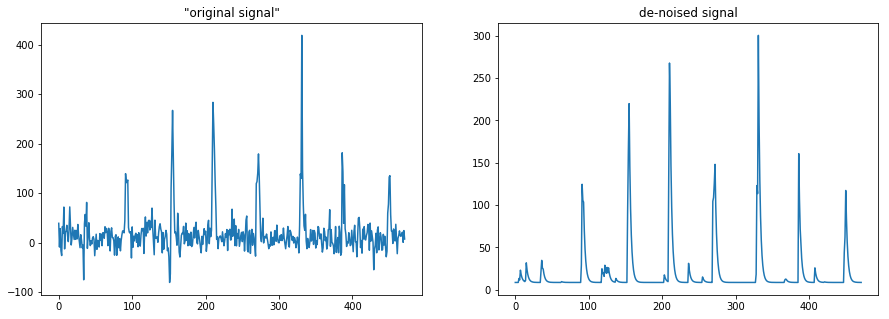

In [23]:
print('convolved components shape:', cnm2.estimates.C.shape)
print('time steps per sample:', cnm2.estimates.C.shape[1]/len(fnames))
fig, axes = plt.subplots(1,2, figsize=(15, 5))

# "original signal" is convolved trace + residuals 
axes[0].plot(cnm2.estimates.C[0,:]+cnm2.estimates.YrA[0,:])
axes[0].set_title('"original signal"')
axes[1].plot(cnm2.estimates.C[0,:])
axes[1].set_title('de-noised signal')
fig.show()

Format of stored ROIs:

In [24]:
print('shape of ROI storage matrix:', cnm2.estimates.A.shape)
print(cnm2.estimates.A.getformat)

shape of ROI storage matrix: (96418, 113)
<bound method spmatrix.getformat of <96418x113 sparse matrix of type '<class 'numpy.float64'>'
	with 31601 stored elements in Compressed Sparse Column format>>


Stored as a flattened scipy.sparse.csc_matrix. Let's try to reshape and display an ROI. We'll need to reshape using the same ordering that it has been formatted/flattened with previously, so reshape in csc_matrix before turning it in to a numpy array.

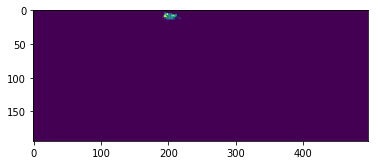

In [25]:
roiArray = cnm2.estimates.A[:,0].reshape(frameshape, order='F').toarray()
plt.imshow(roiArray)
plt.show()

Try plotting all of the the ROIs to see what it looks like

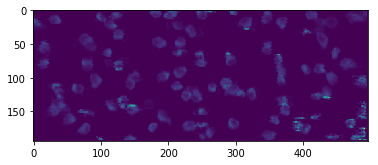

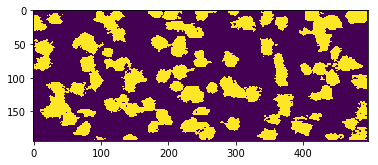

In [26]:
# add all masks up to create one image
allROIs = np.zeros(frameshape)
for i in range(cnm2.estimates.A.shape[1]):
    allROIs += cnm2.estimates.A[:,i].reshape(frameshape, order='F').toarray()

# binarize ROIs
binarized = np.zeros(frameshape)
binarized[allROIs > 0] = 1

plt.imshow(allROIs)
plt.show()
plt.imshow(binarized)
plt.show()

Compare pulling out a signal using one of these ROIs with what is stored in the cnmf.estimates object:

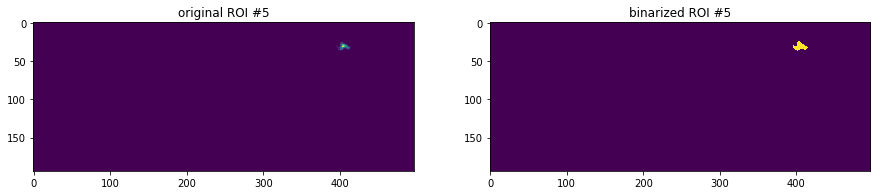

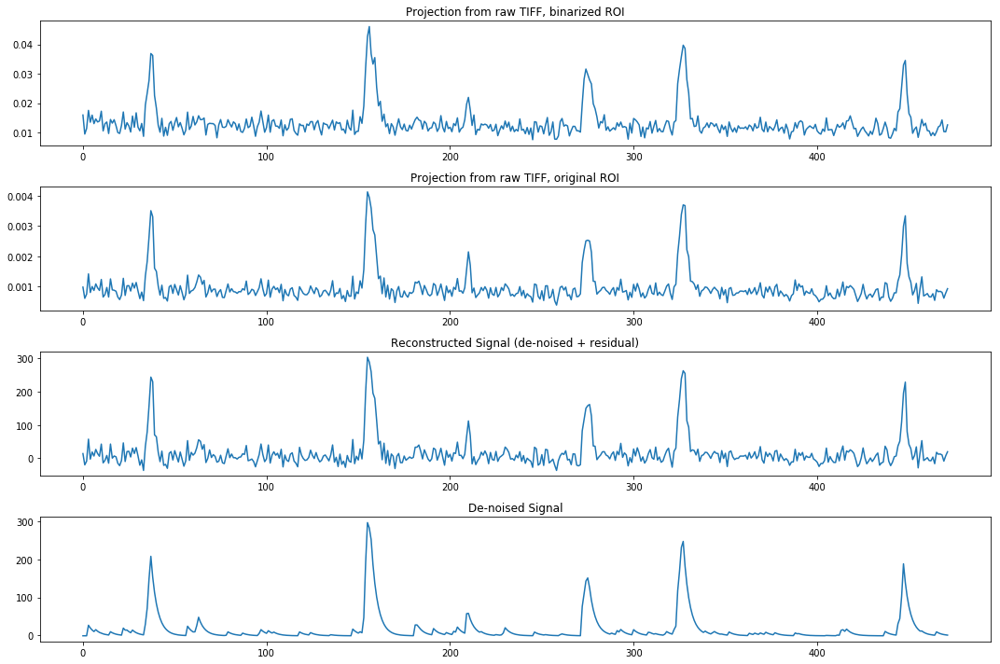

In [49]:
roiIDX = 5
roiMask = cnm2.estimates.A[:, roiIDX].reshape(frameshape, order='F').toarray()
binaryMask = roiMask.copy()
binaryMask[roiMask > 0] = 1


origROI, binaryROI = [], []
for file in fnames:
    movie = imread(file)
    origROI.append((roiMask*movie).mean(axis=1).mean(axis=1))
    binaryROI.append((binaryMask*movie).mean(axis=1).mean(axis=1))
origROI = np.concatenate(origROI, axis=0)
binaryROI = np.concatenate(binaryROI, axis=0)

reconstructed = cnm2.estimates.C[roiIDX, :]+cnm2.estimates.YrA[roiIDX, :]  # +cnm2.estimates.R[roiIDX,:]

fig1, axes1 = plt.subplots(1, 2, figsize=(15, 5))
axes1[0].imshow(roiMask)
axes1[0].set_title('original ROI #%d' % roiIDX)
axes1[1].imshow(binaryMask)
axes1[1].set_title('binarized ROI #%d' % roiIDX)
plt.show()

fig2, axes2 = plt.subplots(4, 1, figsize=(15, 10))
axes2[0].plot(binaryROI)
axes2[0].set_title('Projection from raw TIFF, binarized ROI')
axes2[1].plot(origROI)
axes2[1].set_title('Projection from raw TIFF, original ROI')
axes2[2].plot(reconstructed)
axes2[2].set_title('Reconstructed Signal (de-noised + residual)')
axes2[3].plot(cnm2.estimates.C[roiIDX,:])
axes2[3].set_title('De-noised Signal')

fig2.tight_layout()
plt.show()

Some ROIs seem to be mostly the same whether binarized or not, but others are more dramatic. The smaller noisier ROIs appear to be most affected. For such ROIs, projected signals using the original (non-binary) mask resemble the reconstructed(/de-noised) signals more closely.

Experiment with using mode as a way to find the "base line" that could catch the weird sustained OFF cells (set the level at the top during their sustained plateau). Probably not reliable, but felt like giving it ago after brainstorming the other day.

mode: [0.0009] ; count: [16]


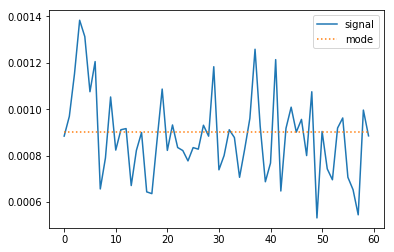

In [50]:
from scipy import stats
stimNum = 1
mode, count = stats.mode(origROI[stimNum*60:stimNum*60+60].round(decimals=4))
print('mode:', mode, '; count:', count)
plt.plot(origROI[stimNum*60:stimNum*60+60], label='signal')
plt.plot(np.ones(60)*mode, linestyle=':', label='mode')
plt.legend()
plt.show()

Try using the ROI contours that have been produced by the CNMF object:

coordinates entries: (128,)
num accepted: 113 ; num rejected: 12


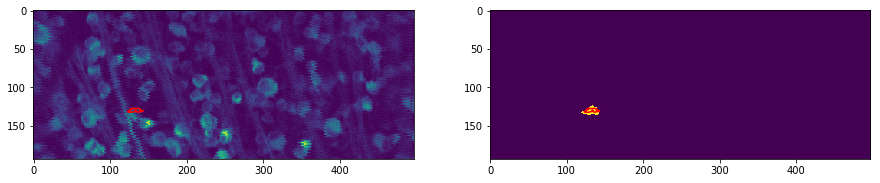

In [29]:
contIDX = 8

print('coordinates entries:', cnm2.estimates.coordinates.shape)
print('num accepted:', len(accepted_idx), '; num rejected:', len(rejected_idx))

# coor = cnm2.estimates.coordinates[accepted_idx[contIDX]-1]['coordinates']
# centre = cnm2.estimates.coordinates[accepted_idx[contIDX]-1]['CoM']

# coor = cnm2.estimates.coordinates[contIDX+1]['coordinates']
# centre = cnm2.estimates.coordinates[contIDX+1]['CoM']

coor = cnm2.estimates.coordinates[accepted_idx[contIDX]]['coordinates']
centre = cnm2.estimates.coordinates[accepted_idx[contIDX]]['CoM']


# binary mask for comparison (NOTE: indices are already only the accepted components)
mask = cnm2.estimates.A[:, contIDX].reshape(frameshape, order='F').toarray()
mask[mask > 0] = 1

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
axes[0].imshow(eximg.mean(axis=0))
axes[0].plot(coor[:,0],coor[:,1], c='r')
axes[0].scatter(centre[1],centre[0], c='r',s=2)
axes[1].imshow(mask)
axes[1].plot(coor[:,0],coor[:,1], c='r')
axes[1].scatter(centre[1],centre[0], c='r',s=2)
plt.show()

In [30]:
print(accepted_idx)
print('length', len(accepted_idx))
print(cnm2.estimates.A.shape)

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  18  19
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  38  39  40  41  42  43  44  45  46  47  48  49  50  52  53  54  55  56
  57  58  59  60  62  63  64  65  66  67  68  69  71  72  73  74  75  76
  77  78  80  81  82  83  85  86  87  89  90  91  94  95  96  97  98  99
 100 102 103 104 106 107 108 109 110 111 112 113 114 115 116 117 118 119
 120 121 122 123 124]
length 113
(96418, 113)


In [31]:
print(rejected_idx)
print('length', len(rejected_idx))

[  0  17  51  61  70  79  84  88  92  93 101 105]
length 12


In [32]:
for i in range(113):
    if accepted_idx[i] != cnm2.estimates.coordinates[accepted_idx[i]-1]['neuron_id']:
        print('buzz')

idx = 0
print(accepted_idx[idx])
print(cnm2.estimates.coordinates[accepted_idx[idx]-1]['neuron_id'])

ids = [cnm2.estimates.coordinates[i]['neuron_id'] for i in range(cnm2.estimates.coordinates.shape[0])]
print(ids)

1
1
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128]


So, after all of this, it would appear that there is in fact a bug that the developers never fixed. The coordinates list isn't being properly trimmed by select_components, and possbily by another function further upstream that refines components. See this git issue: https://github.com/flatironinstitute/CaImAn/issues/401, where the authors fail to understand what the question is about and close the issue. Even when using the accepted_idx list as my corrected index, there are items in cnm2.estimates.coordinates that should not be there that are not accounted for by idx_components_bad (rejected_idx). This was apparent from the excess length of coordinates (> accepted + rejected idx), but I wasn't sure if they were loaded on the end of distributed throughout. They are throughout, as ROI masks match coordinates until 8, then fail at 9 and above (using accepted lookup). There is no way to get around it, since I don't know which coordinates are extra until comparing contour and mask.

In [39]:
g, sn = deconvolution.estimate_parameters(origROI)
print(g)
print(sn)

[ 1.20312818 -0.34933513]
0.0003231703997338434


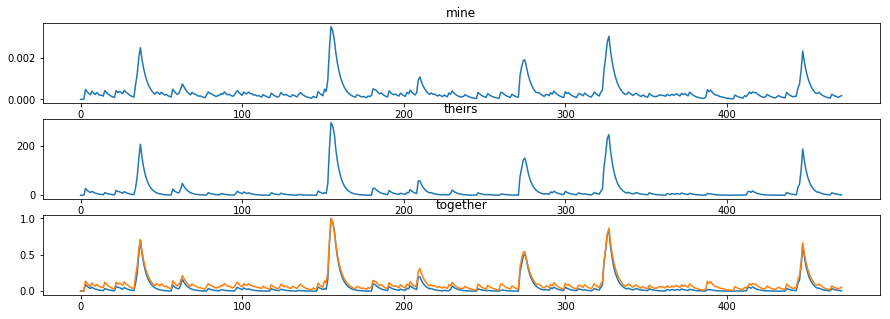

In [57]:
# c, _, _, _, _, _ = deconvolution.cvxpy_foopsi(origROI, g, sn)
c, _, _, _, _, _, _ = deconvolution.constrained_foopsi(origROI, p=1)
fig, axes = plt.subplots(3, 1, figsize=(15, 5))
axes[0].plot(c)
axes[0].set_title('mine')
axes[1].plot(cnm2.estimates.C[roiIDX,:])
axes[1].set_title('theirs')
axes[2].plot(cnm2.estimates.C[roiIDX,:]/cnm2.estimates.C[roiIDX,:].max())
axes[2].plot(c/c.max())
axes[2].set_title('together')
plt.show()

In [54]:
# np.savetxt("origROI.csv", origROI, delimiter=",")

In [55]:
origROI.shape

(472,)